In [1]:
import torch
torch.manual_seed(17)
torch.__version__

'2.0.1+cu118'

In [2]:
import os
import cv2
from PIL import Image
import pandas as pd
import numpy as np

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from albumentations.core.transforms_interface import ImageOnlyTransform,DualTransform
from tqdm.auto import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from glob import glob
import matplotlib.pyplot as plt
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
id2label = {
    0:'background',
    1:'Load',
    2:'Sidewalk',
    3:'Construction',
    4:'Fence',
    5:'Pole',
    6:'Traffic Light',
    7:'Traffic Sign',
    8:'Nature',
    9:'Sky',
    10:'Person',
    11:'Rider',
    12:'Car',
    13:'Background',
}
id2label_check = {
    0:'background',
    1:'Load',
    2:'Sidewalk',
    3:'Construction',
    4:'Fence',
    5:'Pole',
    6:'Traffic Light',
    7:'Traffic Sign',
    8:'Nature',
    9:'Sky',
    10:'Person',
    11:'Rider',
    12:'Car',
    13:'background_car',
    14:'background_255',
}
label2id = {id2label[x]:x for x in id2label}
label2id

{'background': 0,
 'Load': 1,
 'Sidewalk': 2,
 'Construction': 3,
 'Fence': 4,
 'Pole': 5,
 'Traffic Light': 6,
 'Traffic Sign': 7,
 'Nature': 8,
 'Sky': 9,
 'Person': 10,
 'Rider': 11,
 'Car': 12,
 'Background': 13}

In [4]:
# RLE 인코딩 함수
def rle_encode(mask):
    pixels = mask.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [5]:
from transformers import Mask2FormerImageProcessor
from transformers import Mask2FormerForUniversalSegmentation
from transformers import AutoImageProcessor
# # Replace the head of the pre-trained custom
# ## 큰모델 사용안했음 :facebook/maskformer-swin-large-ade
# model_check_point = 'facebook/maskformer-swin-base-ade
# # checkpoint_9
# model_checkpoint = 'facebook/mask2former-swin-base-IN21K-cityscapes-semantic'
model_checkpoint2 = 'best_model_base4'
model_checkpoint = 'last_epoch4'
model_checkpoint3 = 'base3'
# model_checkpoint4 = 'best_model_base4'

# model_checkpoint = 'last_epoch4'
# model_checkpoint = 'base3'

model = Mask2FormerForUniversalSegmentation.from_pretrained(model_checkpoint,
                                                          id2label=id2label,label2id=label2id
                                                          )
model2 = Mask2FormerForUniversalSegmentation.from_pretrained(model_checkpoint2,
                                                          id2label=id2label,label2id=label2id
                                                          )
model3 = Mask2FormerForUniversalSegmentation.from_pretrained(model_checkpoint3,
                                                          id2label=id2label,label2id=label2id
                                                          )
# model = Mask2FormerForUniversalSegmentation.from_pretrained(model_checkpoint,ignore_mismatched_sizes=True)
preprocessor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-cityscapes-semantic")


In [6]:
preprocessor.size = {
    "height": 960,
    "width": 960
}

In [7]:
def color_palette():
    """Color palette that maps each class to RGB values.

    This one is actually taken from ADE20k.
    """
    return [[255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 255, 61],
              [0, 10, 255], [0, 120, 255],[255, 20, 204], [0, 255, 194],
            [51, 0, 255], [0, 194, 255], [0, 122, 255],[0, 112, 255], 
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],[0, 255, 82],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],[0, 31, 255], 
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255],[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            ]

palette = color_palette()

In [8]:

class CustomDataset(Dataset):
    def __init__(self, image_path:list,mask_path:list, transform=None, infer=False):
        self.transform = transform
        self.infer = infer
        self.img_path=image_path
        self.mask_path=mask_path
    def __len__(self):
        # return len(self.data)
        return len(self.img_path)
    

    def __getitem__(self, idx):
        img_path = self.img_path[idx]
        image = cv2.imread(f"{img_path}")
        ori_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if self.infer:
            if self.transform:
                image = self.transform(image=ori_image)['image']
            return image,ori_image
        mask_path = self.mask_path[idx]
        ori_mask = cv2.imread(f"{mask_path}", cv2.IMREAD_GRAYSCALE)
        if self.transform:
            augmented = self.transform(image=ori_image, mask=ori_mask)
            image = augmented['image']
            mask = augmented['mask']
            if mask.size()==0 or image.size()==0:
                print("ERROR READ IMAGE FAILE")
        return image, mask ,ori_image,ori_mask

In [9]:
def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    original_images = inputs[1]
    
    batch = preprocessor.preprocess(
        images,
        ignore_index = 255,
        return_tensors="pt",
    )
    batch["original_images"] = original_images
    return batch


In [11]:
# 768 ,450 =? 1534,900
sub_transform = A.Compose([
    # A.Sharpen(p=1,alpha=0.5),
    # A.Solarize(threshold=128,p=1),
    ToTensorV2(),
])
sub_transform2 = A.Compose([
    # A.Sharpen(p=1,alpha=0.5),
    # A.Solarize(threshold=128,p=1),
    A.HorizontalFlip(p=1),
    ToTensorV2(),
])
sub_transform3 = A.Compose([
    # A.Sharpen(p=1,alpha=1),
    A.HorizontalFlip(p=1),
])

In [12]:
sub_glob= glob('./test_image/*.png')
sub_glob.sort()
sub_dataset = CustomDataset(sub_glob, [], transform=sub_transform, infer=True)
sub_dataset2 = CustomDataset(sub_glob, [], transform=sub_transform2, infer=True)

print(len(sub_dataset))
sub_dataloader = DataLoader(sub_dataset, batch_size=1, shuffle=False,collate_fn=collate_fn)
sub_dataloader2 = DataLoader(sub_dataset2, batch_size=1, shuffle=False,collate_fn=collate_fn)

len(sub_dataloader)

1898


1898

In [13]:
sub_glob[:5]

['./test_image/TEST_0000.png',
 './test_image/TEST_0001.png',
 './test_image/TEST_0002.png',
 './test_image/TEST_0003.png',
 './test_image/TEST_0004.png']

In [14]:
model.to(device)
model2.to(device)
model3.to(device)

Mask2FormerForUniversalSegmentation(
  (model): Mask2FormerModel(
    (pixel_level_module): Mask2FormerPixelLevelModule(
      (encoder): SwinBackbone(
        (embeddings): SwinEmbeddings(
          (patch_embeddings): SwinPatchEmbeddings(
            (projection): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
          )
          (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
        )
        (encoder): SwinEncoder(
          (layers): ModuleList(
            (0): SwinStage(
              (blocks): ModuleList(
                (0-1): 2 x SwinLayer(
                  (layernorm_before): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
                  (attention): SwinAttention(
                    (self): SwinSelfAttention(
                      (query): Linear(in_features=192, out_features=192, bias=True)
                      (key): Linear(in_features=192, out_features=192, bias=True)
                     

In [ ]:
# batch = next(iter(sub_dataloader))

In [ ]:
# for k,v in batch.items():
#   if isinstance(v, torch.Tensor):
#     print(k,v.shape)
#   else:
#     print(k,v[0].shape)

In [15]:
import matplotlib.pyplot as plt
id2label = {
    0:'background',
    1:'Load',
    2:'Sidewalk',
    3:'Construction',
    4:'Fence',
    5:'Pole',
    6:'Traffic Light',
    7:'Traffic Sign',
    8:'Nature',
    9:'Sky',
    10:'Person',
    11:'Rider',
    12:'Car',
    13:'Background',
}
def checking(batch, predicted_segmentation_maps,predicted_segmentation_maps2,predicted_segmentation_maps3,predicted_segmentation_maps4,predicted_segmentation_maps5):
    plt.figure(figsize=(30, 20))
    plt.subplot(2, 1, 1)
    image = batch['original_images'][0]
    # image = batch['pixel_values'][0].permute(1,2,0)
    plt.imshow(image)
    segmentation_map = predicted_segmentation_maps[0].cpu().numpy()
    segmentation_map2 = predicted_segmentation_maps2[0].cpu().numpy()
    segmentation_map3 = predicted_segmentation_maps3[0].cpu().numpy()
    segmentation_map4 = predicted_segmentation_maps4[0].cpu().numpy()
    segmentation_map5 = predicted_segmentation_maps5[0].cpu().numpy()
    
    segmentation_map[segmentation_map2==4] =4
    segmentation_map[segmentation_map3==4] =4
    segmentation_map[segmentation_map4==4] =4
    
    segmentation_map[segmentation_map2==6] =6
    segmentation_map[segmentation_map3==6] =6
    segmentation_map[segmentation_map4==6] =6
    
    segmentation_map[segmentation_map2==10] =10
    segmentation_map[segmentation_map3==10] =10
    segmentation_map[segmentation_map4==10] =10
    
    segmentation_map[segmentation_map2==10] =10
    segmentation_map[segmentation_map3==10] =10
    segmentation_map[segmentation_map4==10] =10
    
    segmentation_map[segmentation_map2==5] =5
    segmentation_map[segmentation_map3==5] =5
    segmentation_map[segmentation_map4==5] =5
    segmentation_map[segmentation_map5==5] =5
    
    # segmentation_map[segmentation_map5==10] =10
    
    segmentation_map[segmentation_map2==11] =11
    segmentation_map[segmentation_map3==11] =11
    segmentation_map[segmentation_map4==11] =11
    # segmentation_map[segmentation_map5==12] =12
    # segmentation_map[segmentation_map5==11] =11
    segmentation_map[segmentation_map2==13] =13
    segmentation_map[segmentation_map3==13] =13
    segmentation_map[segmentation_map4==13] =13

   
    segmentation_map[segmentation_map2==7] =7
    segmentation_map[segmentation_map3==7] =7
    segmentation_map[segmentation_map4==7] =7

    segmentation_map[segmentation_map2==6] =6
    segmentation_map[segmentation_map3==6] =6
    segmentation_map[segmentation_map4==6] =6

    segmentation_map[segmentation_map2==2] =2
    segmentation_map[segmentation_map3==2] =2
    segmentation_map[segmentation_map4==2] =2

   
    print("PREDICT : ", np.unique(segmentation_map))
    # print(list(id2label_check[x] for x in np.unique(segmentation_map)))
    color_segmentation_map = np.zeros(
        (segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8)  # height, width, 3
   
    for label, color in enumerate(palette):
        color_segmentation_map[segmentation_map == label, :] = color
        if label==14:
            break
    
    ground_truth_color_seg = color_segmentation_map[..., ::-1]

    img = image * 0.5 + ground_truth_color_seg * 0.5
    img = img.astype(np.uint8)

    plt.subplot(2, 1, 2)
    plt.imshow(img)

    plt.show()
    # plt.subplot(4,3,2)
    # plt.imshow(np.resize(img,(32,32)))


0it [00:00, ?it/s]

PREDICT :  [ 1  3  4  5  7  9 12 13]


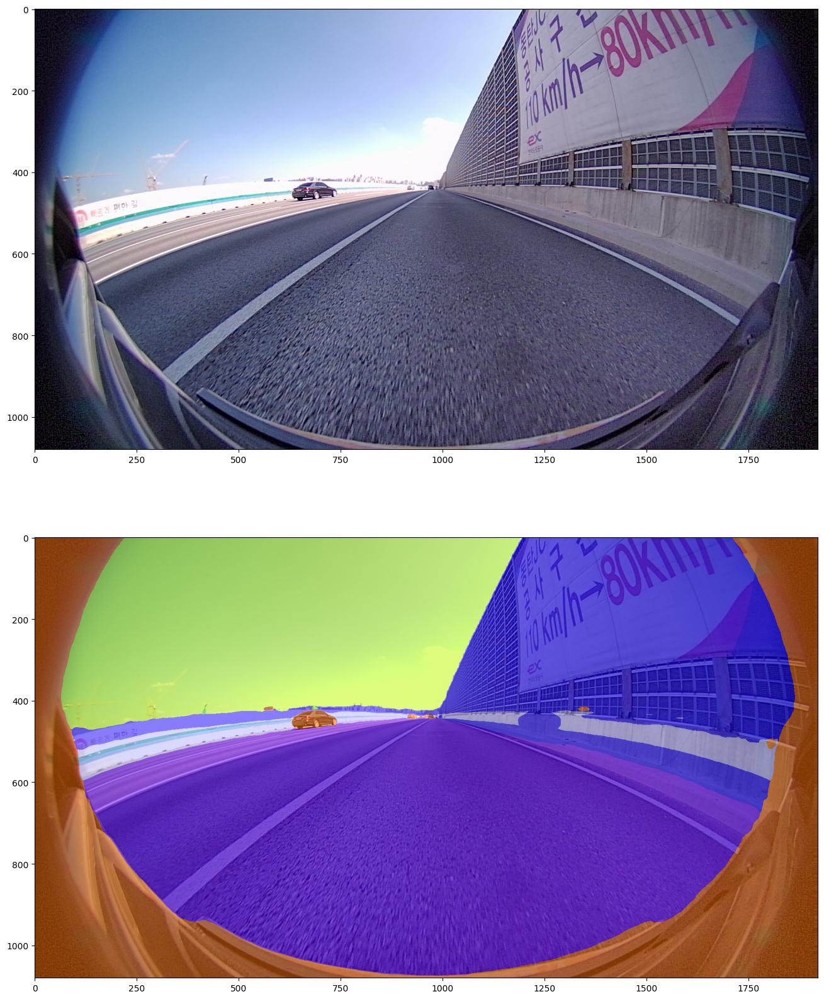

PREDICT :  [ 1  2  3  4  5  6  7  8  9 10 11 12 13]


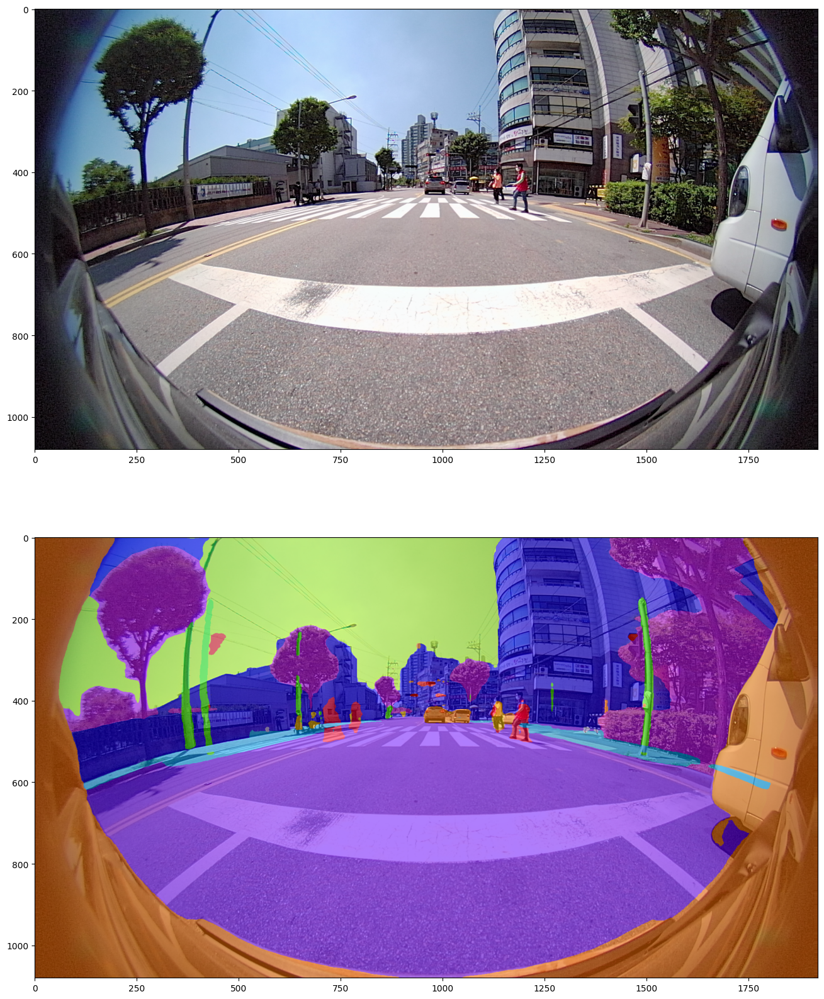

PREDICT :  [ 1  3  5  7  8  9 13]


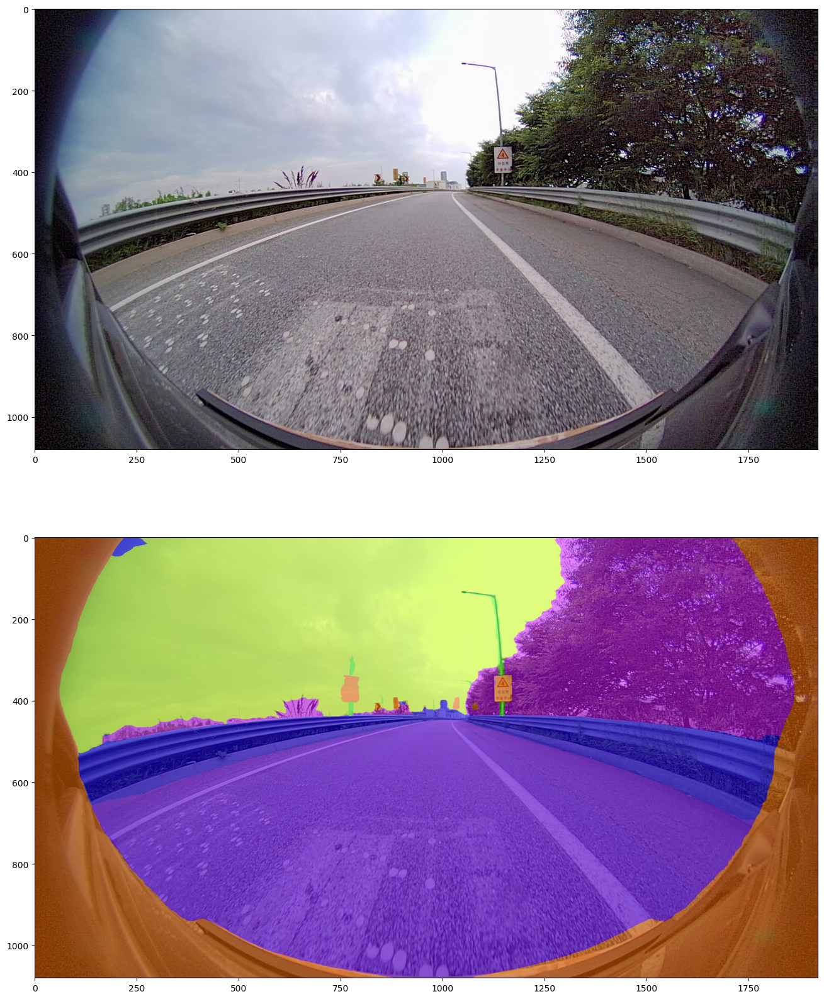

KeyboardInterrupt: 

In [18]:
model.eval()
model2.eval()
model3.eval()

id2label = {
    0:'background',
    1:'Load',
    2:'Sidewalk',
    3:'Construction',
    4:'Fence',
    5:'Pole',
    6:'Traffic Light',
    7:'Traffic Sign',
    8:'Nature',
    9:'Sky',
    10:'Person',
    11:'Rider',
    12:'Car',
    13:'Background',
}
from tqdm.auto import tqdm
i = 0
for batch,batch2 in tqdm(zip(sub_dataloader,sub_dataloader2)):
  pixel_values = batch['pixel_values']
  pixel_values2 = batch2['pixel_values'] # flip image
  # Forward pass
  with torch.no_grad():
    outputs = model(pixel_values=pixel_values.to(device))
    outputs2 = model2(pixel_values=pixel_values.to(device))
    outputs3 = model(pixel_values=pixel_values2.to(device))
    # outputs3.class_queries_logits = torch.flip(outputs3.class_queries_logits,[1,2])
    outputs4 = model2(pixel_values=pixel_values2.to(device))
    # outputs4.class_queries_logits = torch.flip(outputs4.class_queries_logits,[1,2])
    outputs5 = model3(pixel_values=pixel_values.to(device))

  # get original images 
    
    original_images = batch['original_images']

    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,target_sizes=target_sizes)
    predicted_segmentation_maps2 = preprocessor.post_process_semantic_segmentation(outputs2,target_sizes=target_sizes)
    predicted_segmentation_maps3 = preprocessor.post_process_semantic_segmentation(outputs3,target_sizes=target_sizes)
    predicted_segmentation_maps4 = preprocessor.post_process_semantic_segmentation(outputs4,target_sizes=target_sizes)
    predicted_segmentation_maps5 = preprocessor.post_process_semantic_segmentation(outputs5,target_sizes=target_sizes)
    checking(batch,predicted_segmentation_maps,predicted_segmentation_maps2,predicted_segmentation_maps3,predicted_segmentation_maps4,predicted_segmentation_maps5)
  i+=1

In [ ]:
outputs3.class_queries_logits

In [ ]:
# model.eval()
result = []
# fig = plt.figure()

j = 0
for batch,batch2 in tqdm(zip(sub_dataloader,sub_dataloader2)):
  # print(batch.shape)
  pixel_values = batch['pixel_values']
  pixel_values2 = batch2['pixel_values'] # flip image
  
  # Forward pass
  with torch.no_grad():
    outputs = model(pixel_values=pixel_values.to(device))
    outputs2 = model2(pixel_values=pixel_values.to(device))
    outputs3 = model(pixel_values=pixel_values2.to(device)) # trabsfio
    outputs4 = model2(pixel_values=pixel_values2.to(device))
    outputs5 = model3(pixel_values=pixel_values.to(device))
  # get original images 
    
    original_images = batch['original_images']

    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,target_sizes=target_sizes)
    predicted_segmentation_maps2 = preprocessor.post_process_semantic_segmentation(outputs2,target_sizes=target_sizes)
    predicted_segmentation_maps3 = preprocessor.post_process_semantic_segmentation(outputs3,target_sizes=target_sizes)
    predicted_segmentation_maps4 = preprocessor.post_process_semantic_segmentation(outputs4,target_sizes=target_sizes)
    predicted_segmentation_maps5 = preprocessor.post_process_semantic_segmentation(outputs5,target_sizes=target_sizes)
    for pred,pred2,pred3,pred4,pred5 in zip(predicted_segmentation_maps,predicted_segmentation_maps2,predicted_segmentation_maps3,predicted_segmentation_maps4,predicted_segmentation_maps5):
        pred = pred.cpu().numpy()
        pred = pred.astype(np.uint8)
        
        pred2 = pred2.cpu().numpy()
        pred2 = pred2.astype(np.uint8)
        
        pred3 = pred3.cpu().numpy()
        pred3 = pred3.astype(np.uint8)
        # pred3 =sub_transform3(image=pred3)['image']
        
        
        pred4 = pred4.cpu().numpy()
        pred4 = pred4.astype(np.uint8)
        # pred4 =sub_transform3(image=pred4)['image']

        pred5 = pred5.cpu().numpy()
        pred5 = pred5.astype(np.uint8)

            
        pred[pred2==4] =4
        pred[pred3==4] =4
        pred[pred4==4] =4
    
        pred[pred2==6] =6
        pred[pred3==6] =6
        pred[pred4==6] =6
    
        pred[pred2==10] =10
        pred[pred3==10] =10
        pred[pred4==10] =10
        
        pred[pred2==10] =10
        pred[pred3==10] =10
        pred[pred4==10] =10
        
        pred[pred2==5] =5
        pred[pred3==5] =5
        pred[pred4==5] =5
        pred[pred5==5] =5
        
        # segmentation_map[segmentation_map5==10] =10
        
        pred[pred2==11] =11
        pred[pred3==11] =11
        pred[pred4==11] =11
        # segmentation_map[segmentation_map5==12] =12
        # segmentation_map[segmentation_map5==11] =11
        pred[pred2==13] =13
        pred[pred3==13] =13
        pred[pred4==13] =13
    
       
        pred[pred2==7] =7
        pred[pred3==7] =7
        pred[pred4==7] =7
    
        pred[pred2==6] =6
        pred[pred3==6] =6
        pred[pred4==6] =6
    
        pred[pred2==2] =2
        pred[pred3==2] =2
        pred[pred4==2] =2

        # filename = f'./test_mask/test_mask_{j:04d}.png'
        # cv2.imwrite(filename, pred)
        # j+=1
        
        pred = Image.fromarray(pred) # 이미지로 변환
        pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
        pred = np.array(pred) # 다시 수치로 변환
        
        # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
        for class_id in range(1,13):
            class_mask = (pred == class_id).astype(np.uint8)
            if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                mask_rle = rle_encode(class_mask)
                result.append(mask_rle)
            else: # 마스크가 존재하지 않는 경우 -1
                result.append(-1)


In [ ]:
submit = pd.read_csv('./sample_submission.csv')
submit['mask_rle'] = result
submit

In [ ]:
submit.to_csv('./baseline_submit59.csv', index=False)